In this notebook I try to implement a variation of a resnet, based on the original paper available here: https://arxiv.org/pdf/1512.03385.pdf

The idea behind the resodual block, the key element of this paper, is that we are trying to learn a function H(x) with stacked convolutional layers. However, even if neural nets can learn arbitrarily complicated functions with enough depth, H(x) may be difficult to learn. It can be easier to learn the residual function H(x) - x. According to the paper, these networks can be easier to optimize and can allow for deeper architectures. Deeper architectures are beneficial when performing image classisfication.

In practice, the way this works is that we make a block containing a number of convolutional layers. We then add the input to the first convolutional layer in the block to the output of the last - this is called a shortcut connection. 

I will be working with a dataset on plant leaf classification obtained from kaggle, available here:
https://www.kaggle.com/datasets/csafrit2/plant-leaves-for-image-classification. This dataset contains images of the leaves of 12 different kinds of plants, in healthy and diseased states. 

Import basic packages for preprocessing, etc.:

In [1]:
import numpy as np
import cv2
import xml.etree.ElementTree as et
from sklearn.model_selection import train_test_split
from scipy import ndimage

import sys
import os
from PIL import Image
from glob import glob
import h5py

The images for each class (split along leaf type and healthiness) are in different directories. Below, I obtain the names of each class/directory. 

In [2]:
### get directory location
raw_locs = glob("./plant_data/train/*")
imgs_post = []
for i in range(len(raw_locs)):
    imgs_post.append(raw_locs[i].split('/')[-1])
print(imgs_post)

['Pongamia Pinnata diseased (P7b)', 'Arjun healthy (P1b)', 'Alstonia Scholaris diseased (P2a)', 'Gauva healthy (P3a)', 'Chinar diseased (P11b)', 'Arjun diseased (P1a)', 'Pomegranate healthy (P9a)', 'Chinar healthy (P11a)', 'Mango healthy (P0a)', 'Jatropha healthy (P6a)', 'Jatropha diseased (P6b)', 'Jamun diseased (P5b)', 'Jamun healthy (P5a)', 'Lemon healthy (P10a)', 'Pongamia Pinnata healthy (P7a)', 'Bael diseased (P4b)', 'Gauva diseased (P3b)', 'Alstonia Scholaris healthy (P2b)', 'Pomegranate diseased (P9b)', 'Basil healthy (P8)', 'Mango diseased (P0b)', 'Lemon diseased (P10b)']


Below, perform some administrative work for preprocessing:

In [3]:
### labels
plant_type = [7, 1, 2, 3, 11, 1, 9, 11, 0, 6, 6, 5, 5, 10, 7, 4, 3, 2, 9, 8, 0, 10]
health_lvl = [1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1]
for i in range(len(imgs_post)):
    print(imgs_post[i], " ", plant_type[i], " ", health_lvl[i])
loc_plant = dict()
loc_health = dict()
loc_unique = dict()
unique_loc = dict()
for i in range(len(imgs_post)):
    loc_plant[imgs_post[i]] = plant_type[i]
    loc_health[imgs_post[i]] = health_lvl[i]
    loc_unique[imgs_post[i]] = i
    unique_loc[i] = imgs_post[i]


Pongamia Pinnata diseased (P7b)   7   1
Arjun healthy (P1b)   1   0
Alstonia Scholaris diseased (P2a)   2   1
Gauva healthy (P3a)   3   0
Chinar diseased (P11b)   11   1
Arjun diseased (P1a)   1   1
Pomegranate healthy (P9a)   9   0
Chinar healthy (P11a)   11   0
Mango healthy (P0a)   0   0
Jatropha healthy (P6a)   6   0
Jatropha diseased (P6b)   6   1
Jamun diseased (P5b)   5   1
Jamun healthy (P5a)   5   0
Lemon healthy (P10a)   10   0
Pongamia Pinnata healthy (P7a)   7   0
Bael diseased (P4b)   4   1
Gauva diseased (P3b)   3   1
Alstonia Scholaris healthy (P2b)   2   0
Pomegranate diseased (P9b)   9   1
Basil healthy (P8)   8   0
Mango diseased (P0b)   0   1
Lemon diseased (P10b)   10   1


Below, obtain the paths of each image and associate the class label with them.

In [16]:
### load in images
img_train = []
lbl_train = []
img_val = []
lbl_val = []
img_test = []
lbl_test = []

img_pred = []

for loc in imgs_post:
    train_exts = glob("./plant_data/train/" + loc + "/*.JPG")
    val_exts = glob("./plant_data/test/" + loc + "/*.JPG")
    test_exts = glob("./plant_data/valid/" + loc + "/*.JPG")
    for ip1 in train_exts:
        lbl_train.append(loc_unique[loc])
        img_train.append(ip1)
    for ip2 in val_exts:
        lbl_val.append(loc_unique[loc])
        img_val.append(ip2)
    for ip3 in test_exts:
        lbl_test.append(loc_unique[loc])
        img_test.append(ip3)
    print("successfully loaded " + loc)
pred_exts = glob("./plant_data/images to predict/*.JPG")
for ip4 in pred_exts:
        img_pred.append(ip4)
print("done loading")
np_y_train = np.array(lbl_train)
np_y_val = np.array(lbl_val)
np_y_test = np.array(lbl_test)
print(len(imgs_post))
    

successfully loaded Pongamia Pinnata diseased (P7b)
successfully loaded Arjun healthy (P1b)
successfully loaded Alstonia Scholaris diseased (P2a)
successfully loaded Gauva healthy (P3a)
successfully loaded Chinar diseased (P11b)
successfully loaded Arjun diseased (P1a)
successfully loaded Pomegranate healthy (P9a)
successfully loaded Chinar healthy (P11a)
successfully loaded Mango healthy (P0a)
successfully loaded Jatropha healthy (P6a)
successfully loaded Jatropha diseased (P6b)
successfully loaded Jamun diseased (P5b)
successfully loaded Jamun healthy (P5a)
successfully loaded Lemon healthy (P10a)
successfully loaded Pongamia Pinnata healthy (P7a)
successfully loaded Bael diseased (P4b)
successfully loaded Gauva diseased (P3b)
successfully loaded Alstonia Scholaris healthy (P2b)
successfully loaded Pomegranate diseased (P9b)
successfully loaded Basil healthy (P8)
successfully loaded Mango diseased (P0b)
successfully loaded Lemon diseased (P10b)
done loading
22


Below, some code to load in images. As it turns out, I cannot load in all of the 6000*4000 images on my laptop. The lower function is therefore necessary to load the data in a downsampled manner:

In [5]:
def loadset(indices, mode="train", resample=True, rsratio=5):
    indata = []
    progress = 0
    rspattern = np.zeros((2000*1334, 2))
    print("generating pattern...")
    #for i in range(2000):
    #    for j in range(1333):
    #        rspattern[i*1333 + j] = np.array([j*3, i*3])
    #rspattern.astype(int)
    print("done")
    if mode == "train":
        print(len(img_train))
        print("beginning train data resampling")
        for pth in img_train:
            tidata = cv2.imread(pth)[::rsratio,::rsratio,:]
            indata.append(tidata)
            #print(tidata.shape)
            progress += 1
            if progress % (len(img_train)//10) == 0:
                print("-", progress)
        print("done resampling train data")
    elif mode == "val":
        print("beginning validation data resampling")
        for pth in img_val:
            tidata = cv2.imread(pth)[::rsratio,::rsratio,:]
            indata.append(tidata)
            progress += 1
            if progress % (len(img_val)//10) == 0:
                print("-")
        print("done resampling validation data")
    elif mode == "test":
        print("beginning test data resampling")
        for pth in img_test:
            tidata = cv2.imread(pth)[::rsratio,::rsratio,:]
            indata.append(tidata)
            progress += 1
            if progress % (len(img_test)//10) == 0:
                            print("-")
        print("done resampling test data")
    elif mode == "pred":
        print("beginning prediction data resampling")
        for pth in img_pred:
            tidata = cv2.imread(pth)[::rsratio,::rsratio,:]
            indata.append(tidata)
            progress += 1
            if progress % (len(img_pred)//10) == 0:
                            print("-")
        print("done resampling prediction data")
    elif mode == "blank":
        return None
    else:
        print("error: no such mode!")
    print("done loading data")
    print(indata[0].shape)
    if indices == None:
        indices = np.arange(len(indata))
    return np.array(indata)[indices]

def ls2(idx, mode="train", rsratio=5):
    if mode == "train":
        return cv2.imread(img_train[idx])[::rsratio, ::rsratio, :]
    elif mode == "val":
        return cv2.imread(img_val[idx])[::rsratio, ::rsratio, :]
    elif mode == "test":
        return cv2.imread(img_test[idx])[::rsratio, ::rsratio, :]
    elif mode == "pred":
        return cv2.imread(img_pred[idx])[::rsratio, ::rsratio, :]
    else:
        return None

Below is an example of a full 6000*4000 image:

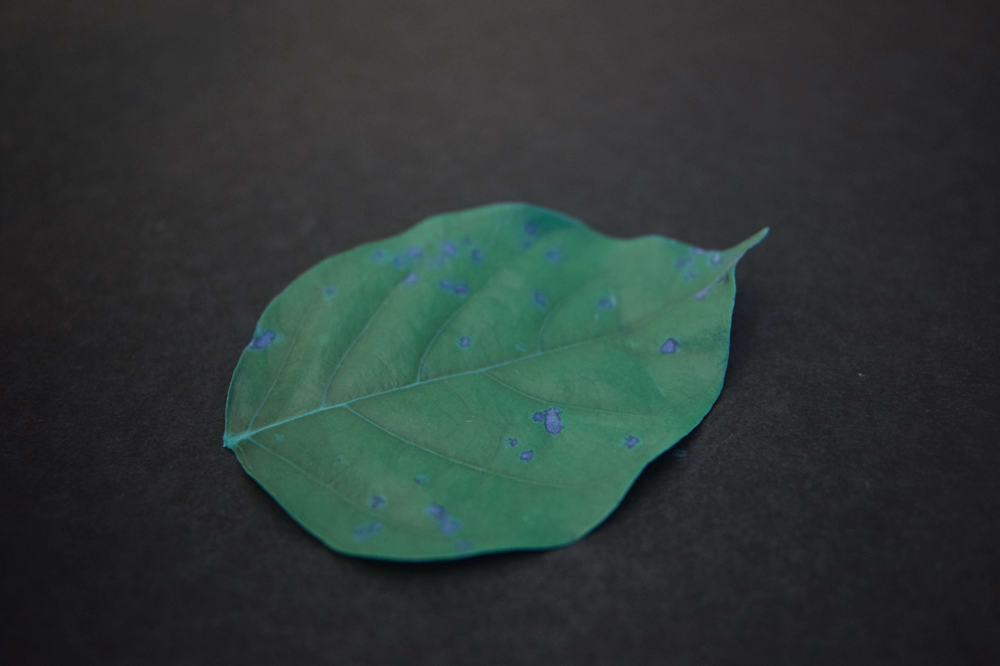

In [119]:
timg = Image.fromarray(cv2.imread(img_train[0]))
display(timg)

I dont really use the below anymore:

In [100]:
idx_shuffle = np.arange(len(img_train))
print(len(img_train))
np.random.shuffle(idx_shuffle)

4274


Below, load all the images in the train set into memory, scaled down to 600*400:

In [101]:
### this is a collossal pain in the butt - memory issues etc.
ls_x = []
np_x = np.zeros((len(img_train), 400, 600, 3))
for i in range(len(img_train)):
    np_x[i, :, :, :] = ls2(i, mode="train", rsratio=10)
    if i % 20 == 0:
        print(i)

0
20
40
60
80
100
120
140
160
180
200
220
240
260
280
300
320
340
360
380
400
420
440
460
480
500
520
540
560
580
600
620
640
660
680
700
720
740
760
780
800
820
840
860
880
900
920
940
960
980
1000
1020
1040
1060
1080
1100
1120
1140
1160
1180
1200
1220
1240
1260
1280
1300
1320
1340
1360
1380
1400
1420
1440
1460
1480
1500
1520
1540
1560
1580
1600
1620
1640
1660
1680
1700
1720
1740
1760
1780
1800
1820
1840
1860
1880
1900
1920
1940
1960
1980
2000
2020
2040
2060
2080
2100
2120
2140
2160
2180
2200
2220
2240
2260
2280
2300
2320
2340
2360
2380
2400
2420
2440
2460
2480
2500
2520
2540
2560
2580
2600
2620
2640
2660
2680
2700
2720
2740
2760
2780
2800
2820
2840
2860
2880
2900
2920
2940
2960
2980
3000
3020
3040
3060
3080
3100
3120
3140
3160
3180
3200
3220
3240
3260
3280
3300
3320
3340
3360
3380
3400
3420
3440
3460
3480
3500
3520
3540
3560
3580
3600
3620
3640
3660
3680
3700
3720
3740
3760
3780
3800
3820
3840
3860
3880
3900
3920
3940
3960
3980
4000
4020
4040
4060
4080
4100
4120
4140
4160
4180
4200
4

Get the size to verify:

In [10]:
print(np_x.shape)

(4274, 400, 600, 3)


Do the same for the validation and test sets:

In [102]:
#val_shuffle = np.arange(len(img_val))
np_val = np.zeros((len(img_val), 400, 600, 3))
for i in range(len(img_val)):
    np_val[i, :, :, :] = ls2(i, mode="val", rsratio=10)

#test_shuffle = np.arange(len(img_test))
np_test = np.zeros((len(img_test), 400, 600, 3))
for i in range(len(img_test)):
    np_test[i, :, :, :] = ls2(i, mode="test", rsratio=10)

import some keras modules to build my neural nets:

In [103]:
### do keras imports
import tensorflow as tf
import tensorflow.keras.layers
import tensorflow.keras.utils as kr_utils
import tensorflow.keras.regularizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, MaxPooling2D, Add, BatchNormalization, Dropout, Flatten, Input, InputLayer, Conv2D, ReLU
from tensorflow.keras.initializers import RandomUniform
from tensorflow.keras.callbacks import ModelCheckpoint

Below, make the residual layer based on how it is described in the paper. This supports an arbitrary number of convolutional layers per block, and arbitrary numbers of filters, sizes of kernels, and lengths of stride for each. In the event that the output dimension is different from the input dimension, the input x should be run through an appropriate number of convolutions with kernel size 1. 

In [104]:
### y = F(x, {wi}) + x
### y = F(x, {wi}) + Wsx
def reslayer(x_in, conv_ksize, conv_fs, conv_strides, batchnormalize, n_convs, x_half=0):
    #y = x_in
    for i in range(n_convs):
        if i == 0:
            y = Conv2D(kernel_size=conv_ksize[i], filters=conv_fs[i], strides=conv_strides[i], padding="same", activation="relu")(x_in)
        else:
            y = Conv2D(kernel_size=conv_ksize[i], filters=conv_fs[i], strides=conv_strides[i], padding="same", activation="relu")(y)
        if batchnormalize[i]:
            y = BatchNormalization()(y)
    for i in range(x_half):
        x_in = Conv2D(kernel_size=1, filters=conv_fs[-1], strides=2, padding="same")(x_in)
    y = Add()([x_in, y])
    y = ReLU()(y)
    if batchnormalize[-1]:
        y = BatchNormalization()(y)
    return y

Below, define some variables for the experiment and model

In [105]:
### vars for model
rn1_inshape = (384, 384, 3)
n_res_blocks = 10
os.system("mkdir model_saves")
saveloc = "./model_saves/"

mkdir: model_saves: File exists


Define a custom callback to track training loss:

In [106]:
class lossCallback(tf.keras.callbacks.Callback):
  def __init__ (self):
    self.loss_log = []
  def on_epoch_end(self, epoch, logs={}):
    self.loss_log.append(logs.get('accuracy'))

define a data sequence to assist with batch loading data and doing some amount of data augmentation.
This is in part inspired by a website linked below.

This keeps track of images and labels in one place. 
The "data augmentation" is just picking a 384x384 patch from the image at random. This has the benefit of reducing the model input size to 384x384, which is 3*2^7 x 3*2^7, a relatively nice number.

In [112]:
class datagen(tensorflow.keras.utils.Sequence):
    def __init__ (self, core_imgs, labels, batch_size=32, dim_out=(384, 384, 3),
                  base_dim=(400, 600, 3), shuffle=True, rmode=True):
        self.imgs = core_imgs
        self.y = labels
        self.batch_size = batch_size
        self.img_dim = dim_out
        self.rmode = rmode

        self.shuffle = shuffle

        self.index = np.arange(len(self.y))
        self.on_epoch_end()

        self.dim0_slack = base_dim[0] - dim_out[0]
        self.dim1_slack = base_dim[1] - dim_out[1]

    def __len__(self):
        return int(np.floor(len(self.y) / self.batch_size))

    def __getitem__(self, idx):
        ### this section inspired by tutorial from stanford:
        ### https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly
        # Generate indexes of the batch
        #indexes = self.index[indexi*self.batch_size:(indexi+1)*self.batch_size]
        ret_indices = self.index[idx * self.batch_size: min(((idx+1) * self.batch_size), len(self.index))]

        # Generate data
        X, y = self.__data_generation(ret_indices)

        return X, y

    def __data_generation(self, list_IDs_temp):
        x_out = np.empty((self.batch_size, self.img_dim[0], self.img_dim[1], self.img_dim[2]))
        y_out = np.empty((self.batch_size,), dtype=int)
        for i in range(len(list_IDs_temp)):
            r0 = np.random.randint(0, self.dim0_slack)
            r1 = np.random.randint(0, self.dim1_slack)
            x_out[i,:,:,:] = self.imgs[list_IDs_temp[i], r0:r0+self.img_dim[0], r1:r1+self.img_dim[1],:]
            y_out[i] = self.y[list_IDs_temp[i]]
        return x_out, np.reshape(y_out, (-1, 1))

    def on_epoch_end(self):
        if self.shuffle == True:
            np.random.shuffle(self.index)



below, make datagen objects for the train and validation set.

In [127]:
print(np_y_train.shape)
print(np.unique(np_y_train))
train_data_obj = datagen(np_x, np_y_train, batch_size=32, dim_out=rn1_inshape, base_dim=(400,600,3),shuffle=True)
x_temp, y_temp = train_data_obj[0]
print(x_temp.shape, y_temp.shape)
print(len(train_data_obj))
val_data_obj = datagen(np_val, np_y_val, batch_size=32, dim_out=rn1_inshape, base_dim=(400,600,3),shuffle=True)

(4274,)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
(32, 384, 384, 3) (32, 1)
133


Below, an example training image is shown:

(384, 384, 3)


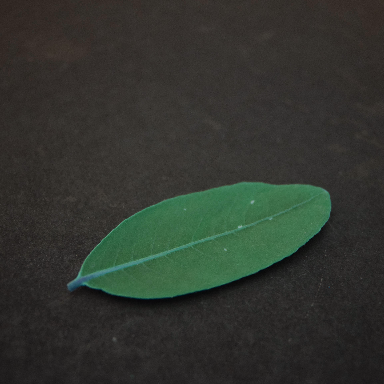

In [132]:
print(x_temp[0].shape)
timg2 = Image.fromarray(x_temp[0].astype(np.uint8))
display(timg2)

Belowm define the residual block model. The architecture is visible in the summary below, but crucially, I include 22 residual blocks to get a pretty deep network. This is importantly not the exact architecture from the paper.

In [114]:
### now build the network
#sq_init = Sequential([InputLayer(input_shape=)])
sq_in = Input(shape=rn1_inshape)
sq = BatchNormalization()(sq_in)
sq = Conv2D(kernel_size=(5, 5), filters=8, strides=2, padding='same', activation='relu')(sq)
sq = MaxPooling2D(2, 2)(sq)
for i in range(4):
    sq = reslayer(sq, [(3, 3), (3, 3)], [8, 8], [1, 1], [True, True, True], 2, 0)
for i in range(1):
    sq = reslayer(sq, [(3, 3), (3, 3)], [16, 16], [1, 2], [True, True, True], 2, 1)
for i in range(8):
    sq = reslayer(sq, [(3, 3), (3, 3)], [16, 16], [1, 1], [True, True, True], 2, 0)
for i in range(1):
    sq = reslayer(sq, [(3, 3), (3, 3)], [32, 32], [1, 2], [True, True, True], 2, 1)
for i in range(8):
    sq = reslayer(sq, [(3, 3), (3, 3)], [32, 32], [1, 1], [True, True, True], 2, 0)
sq = Flatten()(sq)
sq = Dense(500, activation='relu', kernel_initializer=RandomUniform(minval=-0.5, maxval=0.5,seed=None))(sq)
sq = Dense(500, activation='relu', kernel_initializer=RandomUniform(minval=-0.5, maxval=0.5,seed=None))(sq)
sq = Dense(40, activation='relu', kernel_initializer=RandomUniform(minval=-0.5, maxval=0.5,seed=None))(sq)
sq_out = Dense(22, activation='softmax')(sq)

res1 = Model(sq_in, sq_out)
print(res1.summary())
res1.compile(optimizer=tensorflow.keras.optimizers.Adam(learning_rate=0.0001),
             loss = tensorflow.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
             metrics=['accuracy'])


Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 384, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 batch_normalization_942 (Batch  (None, 384, 384, 3)  12         ['input_23[0][0]']               
 Normalization)                                                                                   
                                                                                                  
 conv2d_663 (Conv2D)            (None, 192, 192, 8)  608         ['batch_normalization_942[0][0]']
                                                                                           

Initialize some model checkpoints for the res block model:

In [115]:
callbacks1 = []
cb1_checkpt = ModelCheckpoint(saveloc + "res1_checkpoint.h5",
                    verbose=2,
                    save_best_only=True,
                    save_freq="epoch",
                    save_weights_only = True)
cb1_losscb = lossCallback()
callbacks1.append(cb1_checkpt)
callbacks1.append(cb1_losscb)

Train the model:

In [116]:
res1.fit(train_data_obj, callbacks=callbacks1, epochs=50, verbose=1, validation_data=val_data_obj)

Epoch 1/50
133/133 [==============================] - ETA: 0s - loss: 425.7092 - accuracy: 0.0049
Epoch 1: val_loss improved from inf to 3.09095, saving model to ./model_saves/res1_checkpoint.h5
133/133 [==============================] - 371s 3s/step - loss: 425.7092 - accuracy: 0.0049 - val_loss: 3.0909 - val_accuracy: 1.0000
Epoch 2/50
133/133 [==============================] - ETA: 0s - loss: 89.8476 - accuracy: 0.3496
Epoch 2: val_loss did not improve from 3.09095
133/133 [==============================] - 397s 3s/step - loss: 89.8476 - accuracy: 0.3496 - val_loss: 3.0916 - val_accuracy: 1.0000
Epoch 3/50
133/133 [==============================] - ETA: 0s - loss: 22.8286 - accuracy: 0.7232
Epoch 3: val_loss did not improve from 3.09095
133/133 [==============================] - 363s 3s/step - loss: 22.8286 - accuracy: 0.7232 - val_loss: 3.3368 - val_accuracy: 0.9688
Epoch 4/50
133/133 [==============================] - ETA: 0s - loss: 12.0089 - accuracy: 0.8534
Epoch 4: val_loss di

Oh no! It actually ended up performing really badly! I spent a lot of time retraining the model and trying to bugfix this, and I cannot for the life of me figure out what is going on. The behavior is strange: the model at first does well -- the training accuracy improves, as does the validation accuracy. However, partway through training, performance craters: the training accuracy drops to near zero and the validation accuracy drops zero while the loss continues to improve. This is baffling to me. I investigated the data to ensure that the labels were correct and consistent across training and validation sets; I ensured that the labels and images were inserted into the arrays in the correct order; and worst of all, the same thing happens below for a much simpler model.

Please let me know, reviewer, if you have any ideas as to why this is happening. My only theory at the moment is that something is going wrong in the batch loading object, but I am not sure what.

On the bright side, the model performs well early in training.

In [117]:
sans_res = Sequential([InputLayer(input_shape=rn1_inshape),
                       BatchNormalization(),
                       Conv2D(kernel_size=(5,5), filters=8, strides=2,padding='same',activation='relu'),
                       MaxPooling2D(2, 2),
                       Conv2D(kernel_size=(3,3), filters=8, strides=1,padding='same',activation='relu'),
                       BatchNormalization(),
                       Conv2D(kernel_size=(3,3), filters=16, strides=2,padding='same',activation='relu'),
                       BatchNormalization(),
                       Conv2D(kernel_size=(3,3), filters=32, strides=2,padding='same',activation='relu'),
                       BatchNormalization(),
                       Flatten(),
                       Dense(500, activation='relu', kernel_initializer=RandomUniform(minval=-0.5, maxval=0.5,seed=None)),
                       Dense(500, activation='relu', kernel_initializer=RandomUniform(minval=-0.5, maxval=0.5,seed=None)),
                       Dense(40, activation='relu', kernel_initializer=RandomUniform(minval=-0.5, maxval=0.5,seed=None)),
                       Dense(22, activation='softmax')])

print(sans_res.summary())
sans_res.compile(loss = tensorflow.keras.losses.SparseCategoricalCrossentropy(),
                          optimizer=tensorflow.keras.optimizers.Adam(learning_rate=0.0001),
                          metrics=['accuracy'])

callbacks2 = []
cb2_checkpt = ModelCheckpoint(saveloc + "sans_res.h5",
                    verbose=2,
                    save_best_only=True,
                    save_freq="epoch",
                    save_weights_only = True)
cb2_losscb = lossCallback()
callbacks2.append(cb2_checkpt)
callbacks2.append(cb2_losscb)

sans_res.fit(train_data_obj, callbacks=callbacks2, epochs=50, verbose=2, validation_data=val_data_obj)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_1009 (B  (None, 384, 384, 3)      12        
 atchNormalization)                                              
                                                                 
 conv2d_710 (Conv2D)         (None, 192, 192, 8)       608       
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 96, 96, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_711 (Conv2D)         (None, 96, 96, 8)         584       
                                                                 
 batch_normalization_1010 (B  (None, 96, 96, 8)        32        
 atchNormalization)                                              
                                                        

Below is a visualization of the training accuracy for both models:

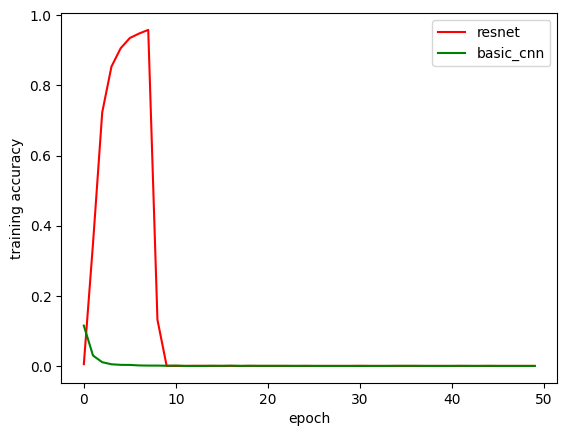

In [133]:
import matplotlib.pyplot as plt
x_plt_data = np.arange(50) ### epoch indices
basic_data = cb1_losscb.loss_log
enet_data = cb2_losscb.loss_log
fig, ax = plt.subplots()
ax.plot(x_plt_data, basic_data, color='red', label='resnet')
ax.plot(x_plt_data, enet_data, color='green', label='basic_cnn')
ax.set(xlabel = 'epoch', ylabel = 'training accuracy')
plt.legend()
plt.show()

This is bizarre performance.